In [1]:
import numpy as np
import pandas as pd
import polars as pl
import polars.selectors as cs
import matplotlib.pyplot as plt
import seaborn as sns
from skrub import TableReport

from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor, IsolationForest
from sklearn.inspection import permutation_importance

import os, glob
import gc
import math

In [2]:
BASE = ".."
COMP_DATA_BASE = os.path.join(BASE, "data", "raw")
PREP_DATA_BASE = os.path.join(BASE, "data", "processed")
FIGURES_BASE = os.path.join(BASE, "figures")

TRAIN_PATH = os.path.join(COMP_DATA_BASE, "train.csv")
TRAIN_DEMO_PATH = os.path.join(COMP_DATA_BASE, "train_demographics.csv")
TEST_PATH = os.path.join(COMP_DATA_BASE, "test.csv")
TEST_DEMO_PATH = os.path.join(COMP_DATA_BASE, "test_demographics.csv")

features = list(pl.read_csv(TRAIN_PATH).select(pl.all().exclude("ID")).columns)
train_ds = pl.read_csv(TRAIN_PATH)
train_demo_ds = pl.read_csv(TRAIN_DEMO_PATH)

In [4]:
print(f"Test columns")
test_cols = list(pl.read_csv(TEST_PATH).columns)
id_cols = test_cols[:4]
acc_cols = [col  for col in test_cols if col.startswith("acc")]
rot_cols = [col  for col in test_cols if col.startswith("rot")]
thm_cols = [col  for col in test_cols if col.startswith("thm")]
tof_cols = [[col  for col in test_cols if col.startswith(f"tof_{i+1}")] for i in range(5)]
target_cols = [col for col in train_ds.columns if col not in test_cols]

print(f"id-cols: {id_cols}")
print(f"acc: {acc_cols}")
print(f"rot: {rot_cols}")
print(f"thm: {thm_cols}")
for i in range(5):
    print(f"tof_{i+1}: {tof_cols[i]}")
    
print(f"Extra train columns")
print(f"{target_cols}")
for col in target_cols:
    print(f"{col+':':15} {train_ds.select(col).unique().to_series().to_list()}")

Test columns
id-cols: ['row_id', 'sequence_id', 'sequence_counter', 'subject']
acc: ['acc_x', 'acc_y', 'acc_z']
rot: ['rot_w', 'rot_x', 'rot_y', 'rot_z']
thm: ['thm_1', 'thm_2', 'thm_3', 'thm_4', 'thm_5']
tof_1: ['tof_1_v0', 'tof_1_v1', 'tof_1_v2', 'tof_1_v3', 'tof_1_v4', 'tof_1_v5', 'tof_1_v6', 'tof_1_v7', 'tof_1_v8', 'tof_1_v9', 'tof_1_v10', 'tof_1_v11', 'tof_1_v12', 'tof_1_v13', 'tof_1_v14', 'tof_1_v15', 'tof_1_v16', 'tof_1_v17', 'tof_1_v18', 'tof_1_v19', 'tof_1_v20', 'tof_1_v21', 'tof_1_v22', 'tof_1_v23', 'tof_1_v24', 'tof_1_v25', 'tof_1_v26', 'tof_1_v27', 'tof_1_v28', 'tof_1_v29', 'tof_1_v30', 'tof_1_v31', 'tof_1_v32', 'tof_1_v33', 'tof_1_v34', 'tof_1_v35', 'tof_1_v36', 'tof_1_v37', 'tof_1_v38', 'tof_1_v39', 'tof_1_v40', 'tof_1_v41', 'tof_1_v42', 'tof_1_v43', 'tof_1_v44', 'tof_1_v45', 'tof_1_v46', 'tof_1_v47', 'tof_1_v48', 'tof_1_v49', 'tof_1_v50', 'tof_1_v51', 'tof_1_v52', 'tof_1_v53', 'tof_1_v54', 'tof_1_v55', 'tof_1_v56', 'tof_1_v57', 'tof_1_v58', 'tof_1_v59', 'tof_1_v60', 'tof

In [5]:
train_demo_ds

subject,adult_child,age,sex,handedness,height_cm,shoulder_to_wrist_cm,elbow_to_wrist_cm
str,i64,i64,i64,i64,f64,i64,f64
"""SUBJ_000206""",1,41,1,1,172.0,50,25.0
"""SUBJ_001430""",0,11,0,1,167.0,51,27.0
"""SUBJ_002923""",1,28,1,0,164.0,54,26.0
"""SUBJ_003328""",1,33,1,1,171.0,52,25.0
"""SUBJ_004117""",0,15,0,1,184.0,54,28.0
…,…,…,…,…,…,…,…
"""SUBJ_063319""",1,25,1,1,173.0,50,29.0
"""SUBJ_063346""",1,42,1,1,183.0,51,26.0
"""SUBJ_063447""",1,36,0,1,175.0,54,25.0


# EDA 

Insights:

- SUBJ_011323/SEQ_000389 and other sequences of this subject have all missing values in their thm and tof sensors
    - 2nd model for those sequences?
- SUBJ_016552/SEQ_001694 have missing thm_5 and tof_5 sensors (all 64 of them at the same time). There are 8 more subjects that have partial sensor failure in training set.
    - backfill? impute? indicator column? Remove?
- SUBJ_030676/SEQ_011975 doesn't have Gesture phase. The entire sequence is Transition which could be a labeling error.
    - Fix labeling or remove?
- SUBJ_040282/SEQ_032114 has a very small Transition phase (3 timesteps).

In [6]:
my_tablereport = TableReport(train_ds.select(pl.exclude(target_cols)))
display(my_tablereport)

Processing column 336 / 336


<TableReport: use .open() to display>

In [7]:
my_tablereport_tar = TableReport(train_ds.select(target_cols))
display(my_tablereport_tar)

Processing column   5 / 5


<TableReport: use .open() to display>

In [39]:
my_tablereport_2 = TableReport(train_demo_ds)
display(my_tablereport_2)

Processing column   8 / 8


,,,,,,,


In [28]:

def plot_subject_sequence(subject, sequence, save=False):

        if save:
                plt.ioff()
        
        data = (train_ds.filter((pl.col("subject") == subject) & (pl.col("sequence_id") == sequence))
                .sort(by="sequence_counter")
                .with_columns([pl.mean_horizontal(pl.col(tof_cols[i])).alias(f'tof_{i+1}_mean') for i in range(5)]))
        target_data = data.select(["sequence_type", "gesture", "orientation"]).unique().to_dicts()[0]

        sub_data = (train_demo_ds
        .filter((pl.col("subject") == subject))
        .with_columns(pl.when(pl.col("adult_child") == 0).then(pl.lit("Child")).otherwise(pl.lit("Adult")).alias("adult_child"),
                pl.when(pl.col("sex") == 1).then(pl.lit("Male")).otherwise(pl.lit("Female")).alias("sex"),
                pl.when(pl.col("handedness") == 1).then(pl.lit("Right")).otherwise(pl.lit("Left")).alias("handedness"),
                )

        ).to_dicts()[0]

        # sub_data.select("adult_child").item()
        # sub_data
        title = f"Subject: {subject} | Sequence: {sequence}\n\
        Gesture: {target_data["gesture"]} | Sequence Type: {target_data["sequence_type"]}  | Orientation: {target_data["orientation"]}  \n\
        Adult or Child: {sub_data["adult_child"]} | Age: {sub_data["age"]} | Sex: {sub_data["sex"]} | Hand: {sub_data["handedness"]} \n\
        Height: {sub_data["height_cm"]} cm | Shoulder to Wrist: {sub_data["shoulder_to_wrist_cm"]} cm | Elbow to Wrist: {sub_data["elbow_to_wrist_cm"]} cm "

        seq_length = data.select("sequence_counter").max().item()

        fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 10), sharex=True)

        columns = [acc_cols + rot_cols, thm_cols, [f'tof_{i+1}_mean' for i in range(5)]]
        fig.suptitle(title, fontsize=14)

        for ax, plot_cols in zip(axes, columns):
        
                long_data = data.select(["sequence_counter"] + plot_cols).unpivot(index='sequence_counter')
                sns.lineplot(ax=ax, data=long_data, x="sequence_counter", y="value", hue='variable')
                for i in range(seq_length - 1):
                        phase = data.filter(pl.col("sequence_counter") == i).select("phase").item()
                        behavior = data.filter(pl.col("sequence_counter") == i).select("behavior").item()
                        if phase == 'Transition':
                                ax.axvspan(max(i-0.5, 0), i+0.5, ymin=0.98 , ymax=1, color='red', alpha=1, linewidth=0)
                        elif phase == 'Gesture':
                                ax.axvspan(max(i-0.5, 0), i+0.5, ymin=0.98 , ymax=1, color='blue', alpha=1, linewidth=0)
                        
                        if behavior == 'Relaxes and moves hand to target location':
                                ax.axvspan(max(i-0.5, 0), i+0.5, ymax=0.98, color='lightgreen', alpha=0.4, linewidth=0)
                        elif behavior == 'Moves hand to target location':
                                ax.axvspan(max(i-0.5, 0), i+0.5, ymax=0.98, color='yellow', alpha=0.4, linewidth=0)
                        elif behavior == 'Hand at target location':
                                ax.axvspan(max(i-0.5, 0), i+0.5, ymax=0.98, color='lightblue', alpha=0.6, linewidth=0)
                        elif behavior == 'Performs gesture':
                                ax.axvspan(max(i-0.5, 0), i+0.5, ymax=0.98, color='orange', alpha=0.4, linewidth=0)

        plt.tight_layout()
        if save:
                plt.savefig(os.path.join(FIGURES_BASE, f"{subject}_{sequence}.png"))
                plt.ion()
        else:
                plt.show()
        plt.close(fig)
        
        
# subject = 'SUBJ_059520'
# sequence = 'SEQ_000007'
# for subject in train_ds.select("subject").unique().to_series().to_list():
#         for sequence in train_ds.filter(pl.col("subject") == subject).select("sequence_id").unique().to_series().to_list():
#                 plot_subject_sequence(subject, sequence)




# Missing values

In [9]:
no_nans = train_ds.drop_nulls()
with_nans = train_ds.join(no_nans, on=["subject", "sequence_id", "row_id"], how='anti')
with_nans

row_id,sequence_type,sequence_id,sequence_counter,subject,orientation,behavior,phase,gesture,acc_x,acc_y,acc_z,rot_w,rot_x,rot_y,rot_z,thm_1,thm_2,thm_3,thm_4,thm_5,tof_1_v0,tof_1_v1,tof_1_v2,tof_1_v3,tof_1_v4,tof_1_v5,tof_1_v6,tof_1_v7,tof_1_v8,tof_1_v9,tof_1_v10,tof_1_v11,tof_1_v12,tof_1_v13,tof_1_v14,tof_1_v15,…,tof_5_v27,tof_5_v28,tof_5_v29,tof_5_v30,tof_5_v31,tof_5_v32,tof_5_v33,tof_5_v34,tof_5_v35,tof_5_v36,tof_5_v37,tof_5_v38,tof_5_v39,tof_5_v40,tof_5_v41,tof_5_v42,tof_5_v43,tof_5_v44,tof_5_v45,tof_5_v46,tof_5_v47,tof_5_v48,tof_5_v49,tof_5_v50,tof_5_v51,tof_5_v52,tof_5_v53,tof_5_v54,tof_5_v55,tof_5_v56,tof_5_v57,tof_5_v58,tof_5_v59,tof_5_v60,tof_5_v61,tof_5_v62,tof_5_v63
str,str,str,i64,str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""SEQ_000174_000000""","""Target""","""SEQ_000174""",0,"""SUBJ_044680""","""Lie on Back""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",3.769531,-1.8125,9.09375,0.738281,-0.196472,-0.088074,-0.639221,23.961725,24.339029,24.206232,24.42981,null,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000174_000001""","""Target""","""SEQ_000174""",1,"""SUBJ_044680""","""Lie on Back""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",3.652344,-1.851562,9.066406,0.741455,-0.195129,-0.087646,-0.636047,23.969862,24.388336,24.263811,24.386974,null,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000174_000002""","""Target""","""SEQ_000174""",2,"""SUBJ_044680""","""Lie on Back""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",3.652344,-1.8125,9.1328125,0.743713,-0.191589,-0.084045,-0.634949,23.94376,24.428949,24.127512,24.437759,null,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000174_000003""","""Target""","""SEQ_000174""",3,"""SUBJ_044680""","""Lie on Back""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",3.5390625,-1.851562,9.175781,0.745483,-0.187866,-0.079895,-0.63446,24.007992,24.486542,24.16885,24.424473,null,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
"""SEQ_000174_000004""","""Target""","""SEQ_000174""",4,"""SUBJ_044680""","""Lie on Back""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",3.4609375,-1.8125,9.175781,0.746887,-0.186401,-0.078003,-0.633545,23.960375,24.441458,24.251478,24.390303,null,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,…,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""SEQ_065452_000079""","""Non-Target""","""SEQ_065452""",79,"""SUBJ_036450""","""Seated Lean Non Dom - FACE DOW…","""Performs gestur

In [17]:
subjects = with_nans.group_by("subject").len().sort(by='len', descending=True)
# display(subjects)
sequences = with_nans.group_by("sequence_id").len().sort(by='len', descending=True)
# display(sequences)
sub_seq = with_nans.group_by("subject").agg(pl.col("sequence_id").n_unique()).sort(by='sequence_id', descending=True)
# display(sub_seq)
row_id = with_nans.group_by("row_id").len().sort(by='len', descending=True)
# display(row_id)
n_nulls = with_nans.with_columns(pl.sum_horizontal(pl.all().is_null()).alias("Nulls")).sort(by="Nulls")
display(n_nulls.group_by("Nulls").len())


Nulls,len
u32,u32
1,4806
4,3692
65,23155
66,763
325,6224


(96, 2)

(6224, 341)


row_id,sequence_type,sequence_id,sequence_counter,subject,orientation,behavior,phase,gesture,acc_x,acc_y,acc_z,rot_w,rot_x,rot_y,rot_z,thm_1,thm_2,thm_3,thm_4,thm_5,tof_1_v0,tof_1_v1,tof_1_v2,tof_1_v3,tof_1_v4,tof_1_v5,tof_1_v6,tof_1_v7,tof_1_v8,tof_1_v9,tof_1_v10,tof_1_v11,tof_1_v12,tof_1_v13,tof_1_v14,tof_1_v15,…,tof_5_v27,tof_5_v28,tof_5_v29,tof_5_v30,tof_5_v31,tof_5_v32,tof_5_v33,tof_5_v34,tof_5_v35,tof_5_v36,tof_5_v37,tof_5_v38,tof_5_v39,tof_5_v40,tof_5_v41,tof_5_v42,tof_5_v43,tof_5_v44,tof_5_v45,tof_5_v46,tof_5_v47,tof_5_v48,tof_5_v49,tof_5_v50,tof_5_v51,tof_5_v52,tof_5_v53,tof_5_v54,tof_5_v55,tof_5_v56,tof_5_v57,tof_5_v58,tof_5_v59,tof_5_v60,tof_5_v61,tof_5_v62,tof_5_v63
u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,…,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,…,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224


(6589, 341)


row_id,sequence_type,sequence_id,sequence_counter,subject,orientation,behavior,phase,gesture,acc_x,acc_y,acc_z,rot_w,rot_x,rot_y,rot_z,thm_1,thm_2,thm_3,thm_4,thm_5,tof_1_v0,tof_1_v1,tof_1_v2,tof_1_v3,tof_1_v4,tof_1_v5,tof_1_v6,tof_1_v7,tof_1_v8,tof_1_v9,tof_1_v10,tof_1_v11,tof_1_v12,tof_1_v13,tof_1_v14,tof_1_v15,…,tof_5_v27,tof_5_v28,tof_5_v29,tof_5_v30,tof_5_v31,tof_5_v32,tof_5_v33,tof_5_v34,tof_5_v35,tof_5_v36,tof_5_v37,tof_5_v38,tof_5_v39,tof_5_v40,tof_5_v41,tof_5_v42,tof_5_v43,tof_5_v44,tof_5_v45,tof_5_v46,tof_5_v47,tof_5_v48,tof_5_v49,tof_5_v50,tof_5_v51,tof_5_v52,tof_5_v53,tof_5_v54,tof_5_v55,tof_5_v56,tof_5_v57,tof_5_v58,tof_5_v59,tof_5_v60,tof_5_v61,tof_5_v62,tof_5_v63
u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,…,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32,u32
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,…,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224,6224


row_id,sequence_type,sequence_id,sequence_counter,subject,orientation,behavior,phase,gesture,acc_x,acc_y,acc_z,rot_w,rot_x,rot_y,rot_z,thm_1,thm_2,thm_3,thm_4,thm_5,tof_1_v0,tof_1_v1,tof_1_v2,tof_1_v3,tof_1_v4,tof_1_v5,tof_1_v6,tof_1_v7,tof_1_v8,tof_1_v9,tof_1_v10,tof_1_v11,tof_1_v12,tof_1_v13,tof_1_v14,tof_1_v15,…,tof_5_v27,tof_5_v28,tof_5_v29,tof_5_v30,tof_5_v31,tof_5_v32,tof_5_v33,tof_5_v34,tof_5_v35,tof_5_v36,tof_5_v37,tof_5_v38,tof_5_v39,tof_5_v40,tof_5_v41,tof_5_v42,tof_5_v43,tof_5_v44,tof_5_v45,tof_5_v46,tof_5_v47,tof_5_v48,tof_5_v49,tof_5_v50,tof_5_v51,tof_5_v52,tof_5_v53,tof_5_v54,tof_5_v55,tof_5_v56,tof_5_v57,tof_5_v58,tof_5_v59,tof_5_v60,tof_5_v61,tof_5_v62,tof_5_v63
str,str,str,i64,str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""SEQ_012314_000000""","""Target""","""SEQ_012314""",0,"""SUBJ_011323""","""Seated Straight""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",7.691406,-2.898438,-5.449219,0.364929,-0.764832,-0.439758,-0.297424,29.066851,29.157558,28.891993,29.43638,34.557819,0.0,0.0,0.0,2.0,-1.0,-1.0,-1.0,-1.0,0.0,1.0,1.0,1.0,0.0,-1.0,-1.0,-1.0,…,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,-1.0,3.0,1.0,0.0,4.0,1.0,1.0,4.0,-1.0,0.0,2.0,0.0,3.0,3.0,0.0,-1.0,1.0
"""SEQ_012314_000001""","""Target""","""SEQ_012314""",1,"""SUBJ_011323""","""Seated Straight""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",7.53125,-3.167969,-5.5625,0.367676,-0.769897,-0.440002,-0.28009,29.149118,29.271235,28.733349,29.504923,34.557819,2.0,1.0,2.0,2.0,-1.0,-1.0,-1.0,-1.0,2.0,2.0,4.0,4.0,4.0,-1.0,-1.0,-1.0,…,2.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,0.0,2.0,2.0,-1.0,-1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
"""SEQ_012314_000002""","""Target""","""SEQ_012314""",2,"""SUBJ_011323""","""Seated Straight""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",7.109375,-3.664062,-5.675781,0.372742,-0.774414,-0.437317,-0.264771,29.30864,29.357376,28.86017,29.472067,34.557819,3.0,3.0,2.0,4.0,-1.0,-1.0,-1.0,-1.0,4.0,5.0,4.0,4.0,4.0,-1.0,-1.0,-1.0,…,0.0,0.0,0.0,-1.0,-1.0,3.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,2.0,-1.0,-1.0,4.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0
"""SEQ_012314_000003""","""Target""","""SEQ_012314""",3,"""SUBJ_011323""","""Seated Straight""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",7.035156,-3.972656,-5.90625,0.386536,-0.772217,-0.438843,-0.248413,29.316441,29.447636,28.756678,29.535791,34.557819,7.0,7.0,9.0,-1.0,-1.0,-1.0,-1.0,-1.0,9.0,9.0,8.0,10.0,-1.0,-1.0,-1.0,-1.0,…,0.0,0.0,0.0,-1.0,-1.0,5.0,3.0,0.0,0.0,0.0,0.0,-1.0,-1.0,5.0,6.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,5.0,0.0,0.0,0.0,0.0,-1.0,-1.0,5.0,7.0,0.0,0.0,0.0,0.0,-1.0,-1.0
"""SEQ_012314_000004""","""Target""","""SEQ_012314""",4,"""SUBJ_011323""","""Seated Straight""","""Moves hand to target location""","""Transition""","""Neck - pinch skin""",7.109375,-3.816406,-5.371094,0.396057,-0.764893,-0.434082,-0.263916,29.298977,29.498253,28.704815,29.502947,34.557819,7.0,9.0,10.0,-1.0,18.0,-1.0,-1.0,-1.0,10.0,11.0,10.0,12.0,-1.0,-1.0,-1.0,-1.0,…,4.0,0.0,0.0,1.0,-1.0,7.0,5.0,3.0,0.0,0.0,0.0,1.0,-1.0,9.0,10.0,4.0,3.0,0.0,0.0,0.0,-1.0,12.0,12.0,9.0,8.0,0.0,0.0,4.0,-1.0,9.0,12.0,7.0,8.0,2.0,0.0,-1.0,-1.0
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""SEQ_065331_000073""","""Target""","""SEQ_065331""",73,"""SUBJ_011323""","""Seated Straight""","""Performs gesture""","""Gesture""","""Cheek - pinch skin""",-2.808594,8.980469,-2.0,0.341309,0.167053,0.764465,0.520752,23.819384,23.851551,25.1

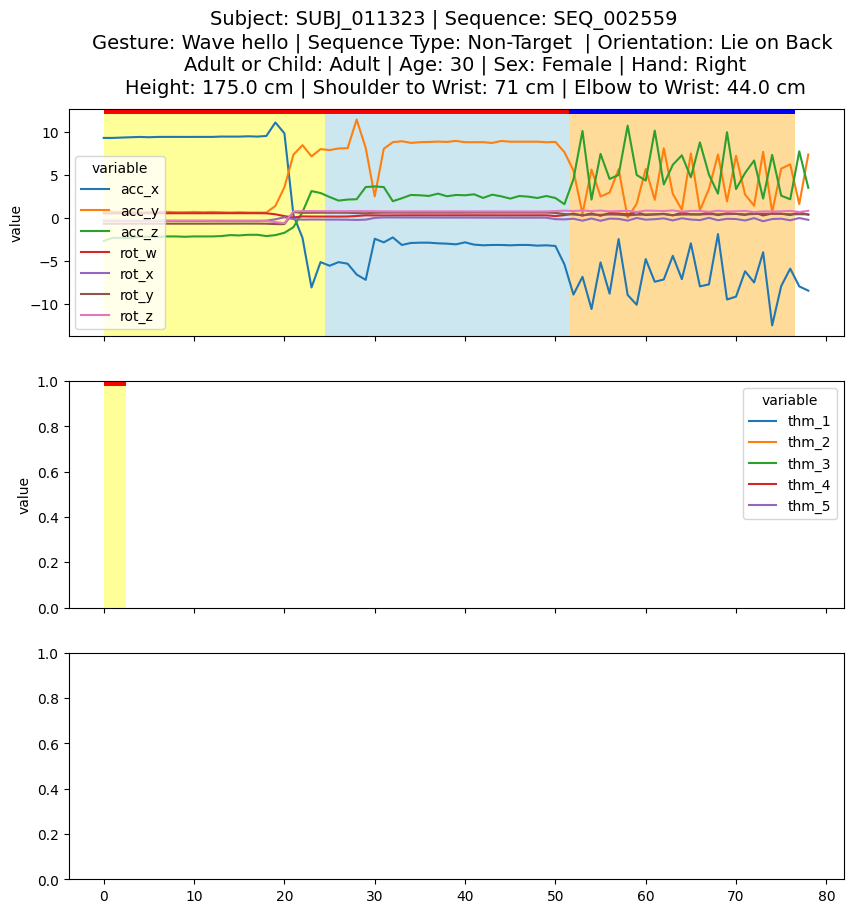

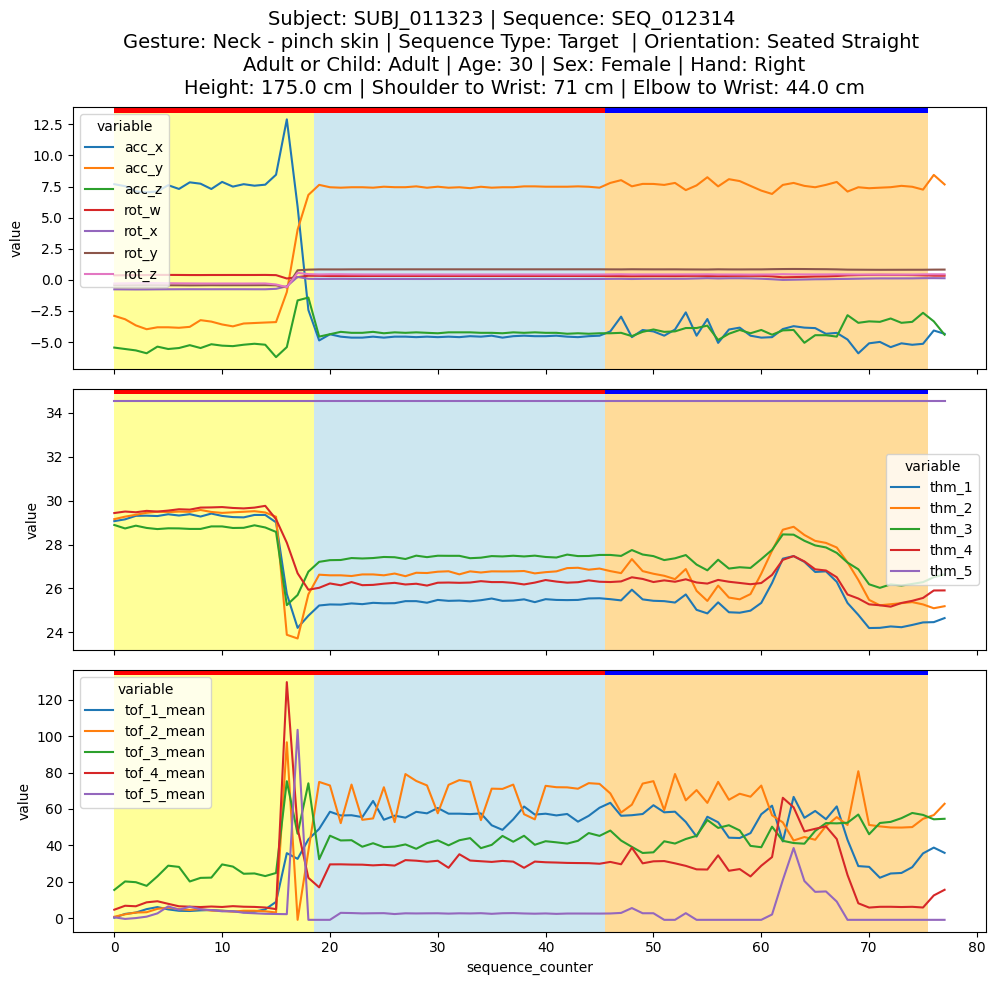

In [23]:

# 325 -> only acc and rot available
sequences = n_nulls.filter(pl.col("Nulls") == 325).select(["subject", "sequence_id"]).unique()
display(sequences.shape)
# display(n_nulls.filter(pl.col("Nulls") == 325))
# for seq in sequences.to_dicts():
#     plot_subject_sequence(seq["subject"], seq["sequence_id"], save=True)

# check if whole sequence is missing -> yes
sequences1 = train_ds.join(sequences, on=["subject", "sequence_id"], how="inner")
print(sequences1.shape)
display(sequences1.null_count())

# check if all sequences for subjects
sequences2 = train_ds.join(sequences.select(["subject"]).unique(), on=["subject"], how="inner")
print(sequences2.shape)
display(sequences2.null_count())
display(sequences2.join(sequences, on=["subject", "sequence_id"], how="anti"))
plot_subject_sequence("SUBJ_011323", "SEQ_012314", save=False)
# train_ds.join(with_gesture, on=["subject", "sequence_id"], how='anti').select(["subject", "sequence_id"]).unique()


In [25]:

# 66 thm_1, thm_5 and all tof_5
sequences = n_nulls.filter(pl.col("Nulls") == 66).select(["subject", "sequence_id"]).unique()
display(sequences.shape)
for seq in sequences.to_dicts():
    plot_subject_sequence(seq["subject"], seq["sequence_id"], save=True)

# # check if whole sequence is missing -> yes
# sequences1 = train_ds.join(sequences, on=["subject", "sequence_id"], how="inner")
# print(sequences1.shape)
# display(sequences1.null_count())

# # check if all sequences for subjects
# sequences2 = train_ds.join(sequences.select(["subject"]).unique(), on=["subject"], how="inner")
# print(sequences2.shape)
# display(sequences2.null_count())
# display(sequences2.join(sequences, on=["subject", "sequence_id"], how="anti"))
# plot_subject_sequence("SUBJ_011323", "SEQ_012314", save=False)
# # train_ds.join(with_gesture, on=["subject", "sequence_id"], how='anti').select(["subject", "sequence_id"]).unique()


(8, 2)

In [ ]:

# 65 thm_5 and all tof_5
# print(n_nulls.filter(pl.col("Nulls") == 65).null_count().unpivot().filter(pl.col("value")!= 0).select("variable").to_series().to_list())
sequences = n_nulls.filter(pl.col("Nulls") == 65).select(["subject", "sequence_id"]).unique()
display(sequences.shape)
for seq in sequences.to_dicts():
    plot_subject_sequence(seq["subject"], seq["sequence_id"], save=True)


In [32]:

# 4 rot missing
# print(n_nulls.filter(pl.col("Nulls") == 4).null_count().unpivot().filter(pl.col("value")!= 0).select("variable").to_series().to_list())
# display(n_nulls.filter(pl.col("Nulls") == 4))
sequences = n_nulls.filter((pl.col("Nulls") == 4) ).select(["subject", "sequence_id"]).unique()
display(sequences.shape)
for seq in sequences.to_dicts():
    plot_subject_sequence(seq["subject"], seq["sequence_id"], save=True)


# 1 one thm column missing for some sequences
# print(n_nulls.filter(pl.col("Nulls") == 1).null_count().unpivot().filter(pl.col("value")!= 0).select("variable").to_series().to_list())
# display(n_nulls.filter(pl.col("Nulls") == 1))

# sequences = n_nulls.filter( (pl.col("Nulls") == 1)).select(["subject", "sequence_id"]).unique()
# display(sequences.shape)
# for seq in sequences.to_dicts():
#     plot_subject_sequence(seq["subject"], seq["sequence_id"], save=True)


(50, 2)

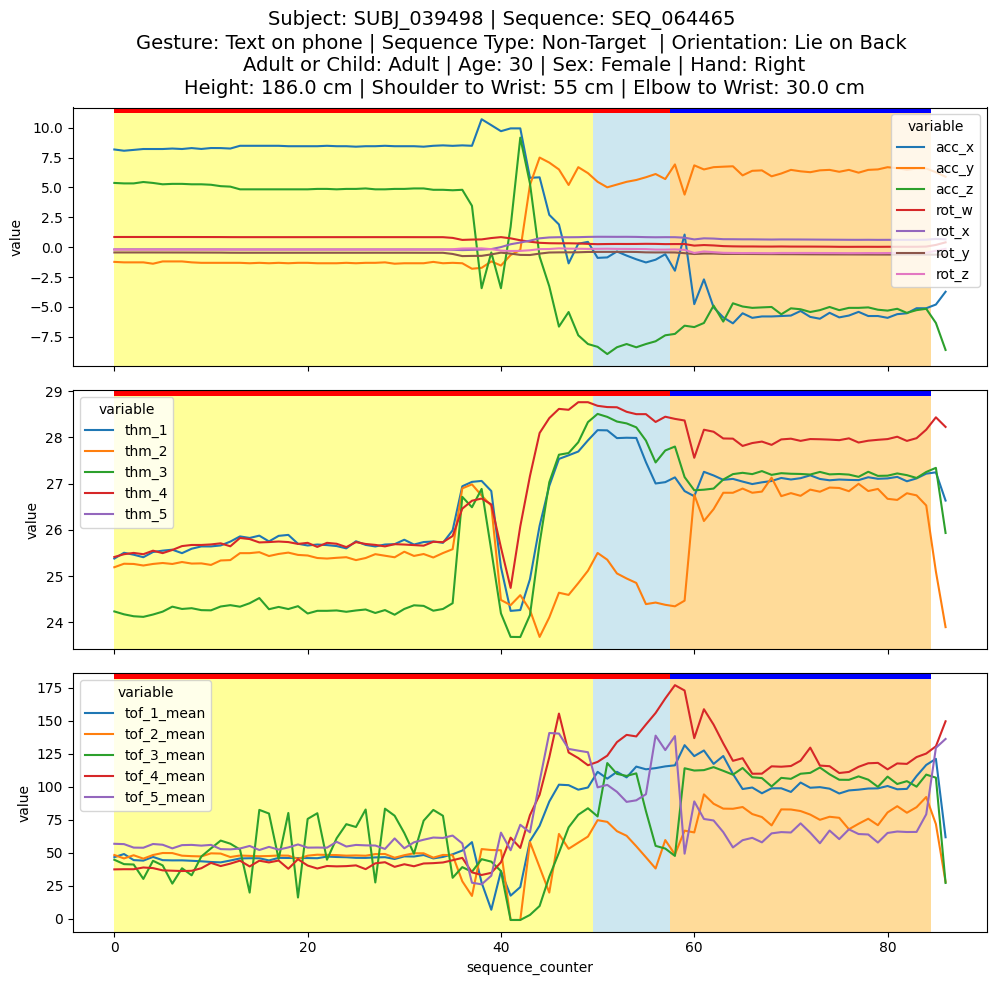

In [52]:
plot_subject_sequence("SUBJ_039498", "SEQ_064465")

### Missing Gesture phase

In [31]:
train_ds.filter(pl.col("sequence_id") != 'SEQ_011975').shape

(574861, 341)

In [30]:
train_ds.filter((pl.col("sequence_id") == 'SEQ_011975') & (pl.col("subject") == 'SUBJ_030676')).shape

(84, 341)

subject,sequence_id
str,str
"""SUBJ_030676""","""SEQ_011975"""


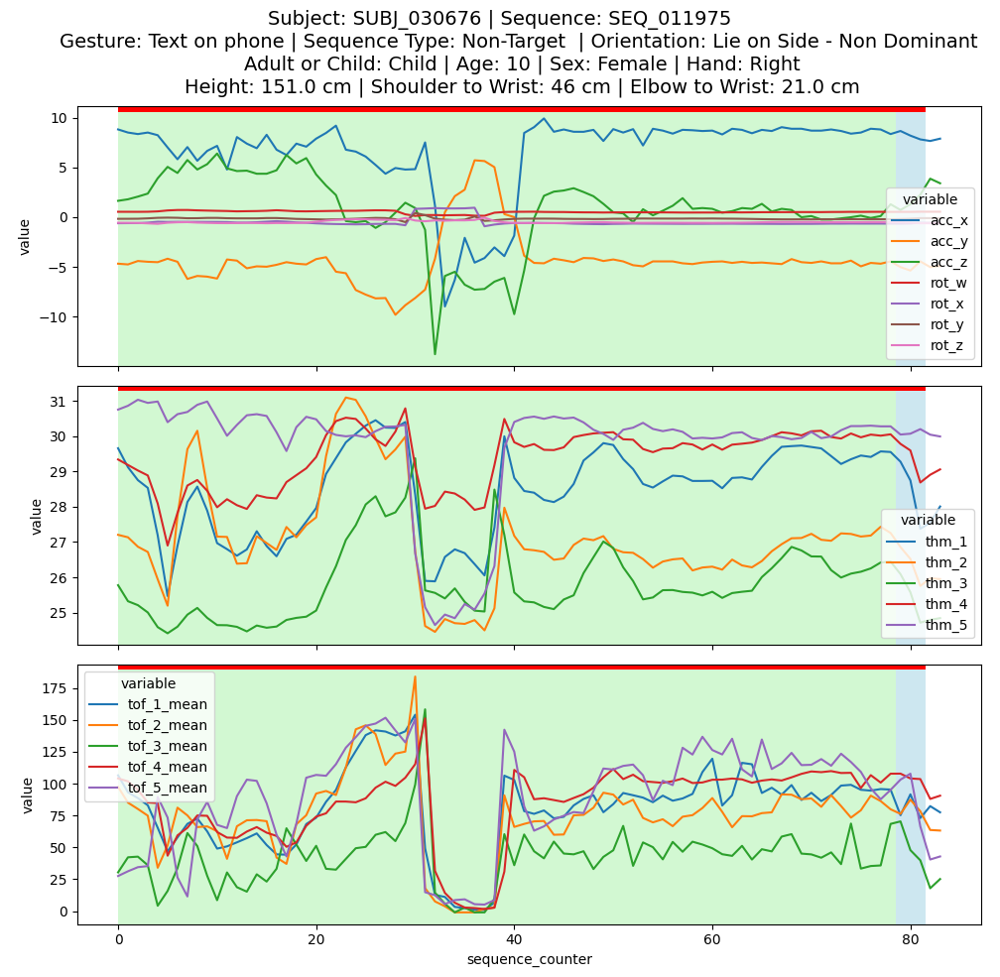

In [8]:


with_gesture = train_ds.filter(pl.col("phase") == "Gesture").select(["subject", "sequence_id"]).unique()
wihout_gesture = train_ds.join(with_gesture, on=["subject", "sequence_id"], how='anti').select(["subject", "sequence_id"]).unique()
display(wihout_gesture)

subject = 'SUBJ_030676'
sequence = 'SEQ_011975'
plot_subject_sequence(subject, sequence)



# Sequence length

In [21]:
train_ds.group_by(["sequence_id"]).len().with_columns(pl.lit(1).alias("col")).group_by("col").agg([pl.min("len").name.suffix("_min"),
                                                                pl.max("len").name.suffix("_max"), 
                                                                pl.mean("len").name.suffix("_mean"), 
                                                                pl.median("len").name.suffix("_median")])

col,len_min,len_max,len_mean,len_median
i32,u32,u32,f64,f64
1,29,700,70.536744,59.0


<Axes: >

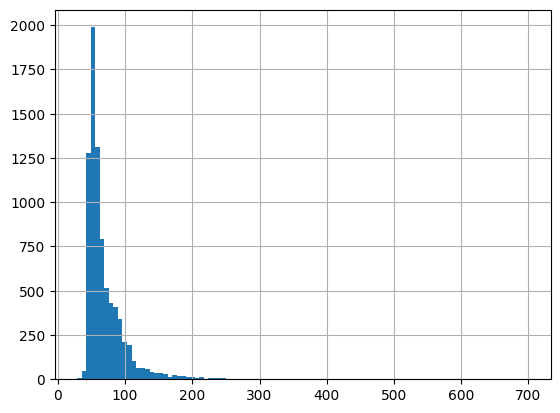

In [24]:
train_ds.group_by(["sequence_id"]).len().to_pandas()["len"].hist(bins=100)

In [27]:
train_ds.group_by(["subject","sequence_id"]).len().sort(by='len', descending=True).head(20)

subject,sequence_id,len
str,str,u32
"""SUBJ_040733""","""SEQ_015261""",700
"""SUBJ_017170""","""SEQ_014205""",671
"""SUBJ_042794""","""SEQ_028188""",647
"""SUBJ_040733""","""SEQ_060593""",630
"""SUBJ_032761""","""SEQ_016031""",567
…,…,…
"""SUBJ_023739""","""SEQ_044999""",340
"""SUBJ_003328""","""SEQ_023057""",332
"""SUBJ_016552""","""SEQ_002852""",322


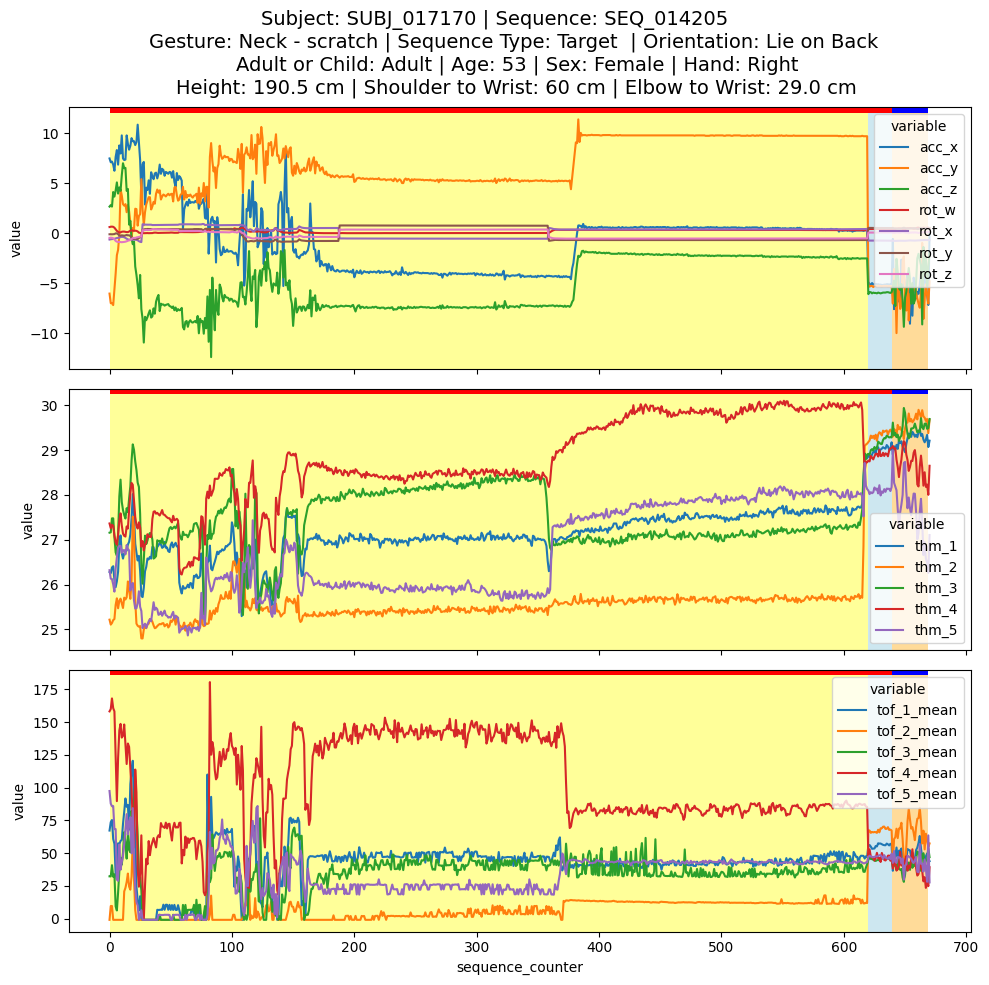

In [31]:
plot_subject_sequence("SUBJ_017170", "SEQ_014205")

In [18]:
train_ds.group_by(["sequence_id", "phase"]).len().group_by(["phase"]).agg([pl.min("len").name.suffix("_min"),
                                                                           pl.max("len").name.suffix("_max"), 
                                                                           pl.mean("len").name.suffix("_mean"), 
                                                                           pl.median("len").name.suffix("_median")])

phase,len_min,len_max,len_mean,len_median
str,u32,u32,f64,f64
"""Transition""",4,670,39.152006,28.0
"""Gesture""",3,71,31.388589,31.0


In [ ]:
# stats for gestures
train_ds.group_by(["sequence_id", "gesture"]).len().group_by(["gesture"]).agg([pl.min("len").name.suffix("_min"),
                                                                           pl.max("len").name.suffix("_max"), 
                                                                           pl.mean("len").name.suffix("_mean"), 
                                                                           pl.median("len").name.suffix("_median")])

gesture,len_min,len_max,len_mean,len_median
str,u32,u32,f64,f64
"""Forehead - pull hairline""",35,190,63.753125,57.0
"""Cheek - pinch skin""",38,302,62.989011,55.0
"""Eyelash - pull hair""",39,200,62.840625,56.0
"""Write name on leg""",42,123,62.968944,56.0
"""Write name in air""",39,374,65.549266,57.0
…,…,…,…,…
"""Neck - scratch""",41,700,88.467187,62.0
"""Wave hello""",34,230,71.874477,60.0
"""Glasses on/off""",43,293,84.111801,68.0


In [30]:
# stats for gestures in gesture phase
train_ds.filter(pl.col("phase") == "Gesture").group_by(["sequence_id", "gesture"]).len().group_by(["gesture"]).agg([pl.min("len").name.suffix("_min"),
                                                                           pl.max("len").name.suffix("_max"), 
                                                                           pl.mean("len").name.suffix("_mean"), 
                                                                           pl.median("len").name.suffix("_median")])

gesture,len_min,len_max,len_mean,len_median
str,u32,u32,f64,f64
"""Forehead - pull hairline""",25,71,31.034375,31.0
"""Above ear - pull hair""",7,50,30.860502,31.0
"""Drink from bottle/cup""",26,57,33.403727,33.0
"""Feel around in tray and pull o…",5,66,35.192547,38.0
"""Write name on leg""",27,46,31.086957,31.0
…,…,…,…,…
"""Neck - scratch""",25,58,31.2625,31.0
"""Wave hello""",18,55,31.960251,31.0
"""Forehead - scratch""",16,62,31.176562,31.0


# Pairplot

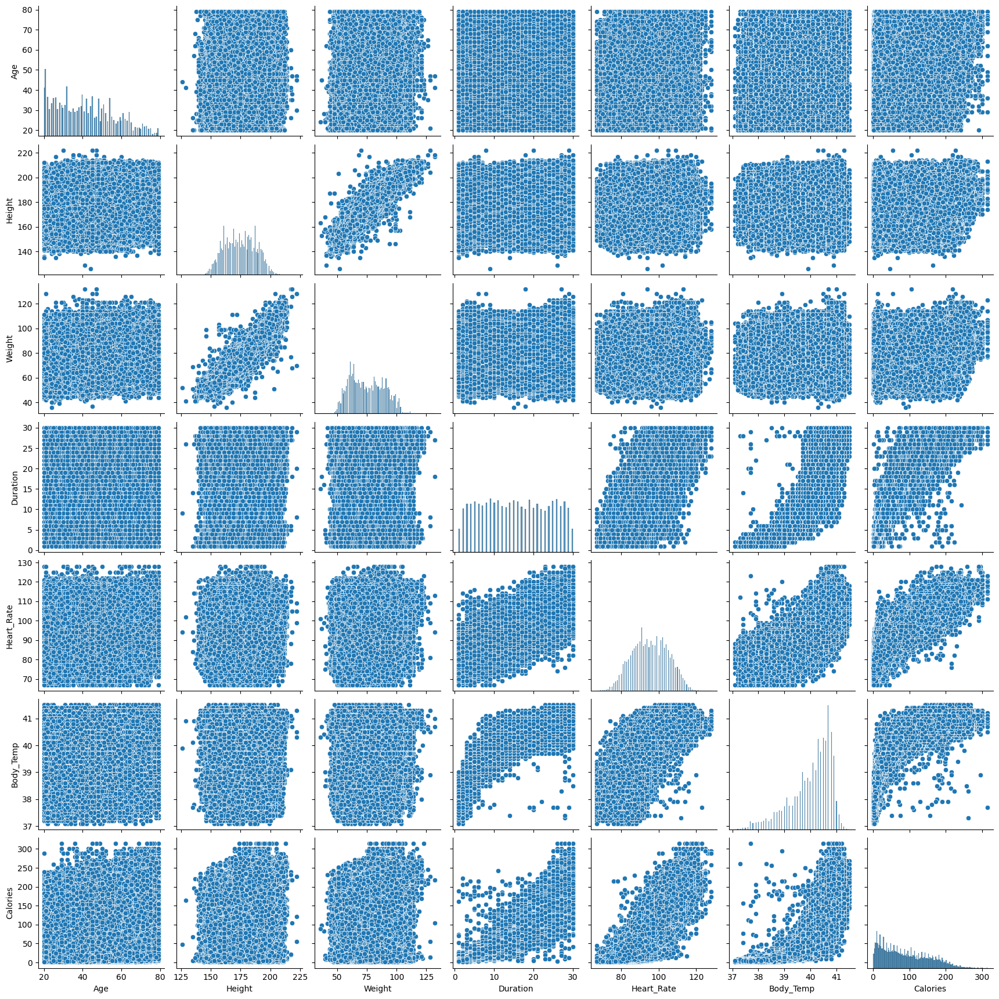

In [18]:
sns.pairplot(train_ds.to_pandas()[num_features + cat_features])

# Correlation

Text(0.5, 1.0, 'Correlation Heatmap')

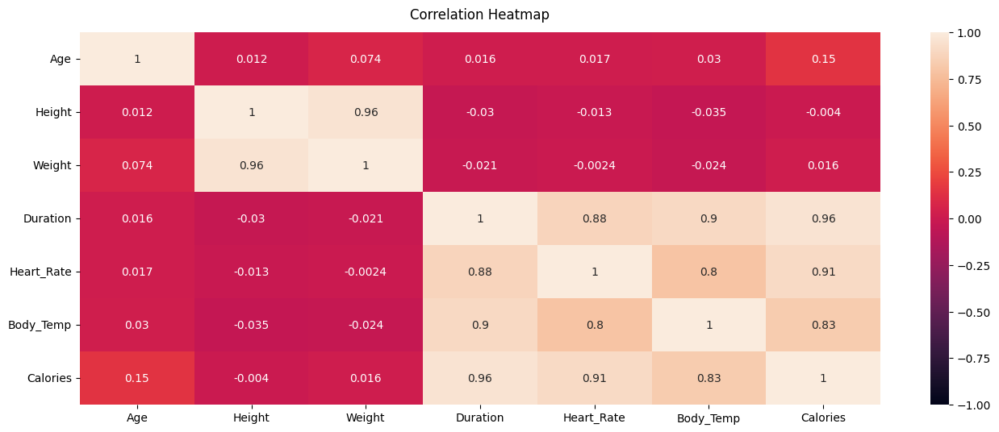

In [21]:
dataframe=train_ds.select(pl.col(num_features )).to_pandas()

# Increase the size of the heatmap.
plt.figure(figsize=(16, 6))
# Store heatmap object in a variable to easily access it when you want to include more features (such as title).
# Set the range of values to be displayed on the colormap from -1 to 1, and set the annotation to True to display the correlation values on the heatmap.
heatmap = sns.heatmap(dataframe.corr(), vmin=-1, vmax=1, annot=True)
# Give a title to the heatmap. Pad defines the distance of the title from the top of the heatmap.
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

Text(0.5, 1.0, 'Features Correlating with Calories')

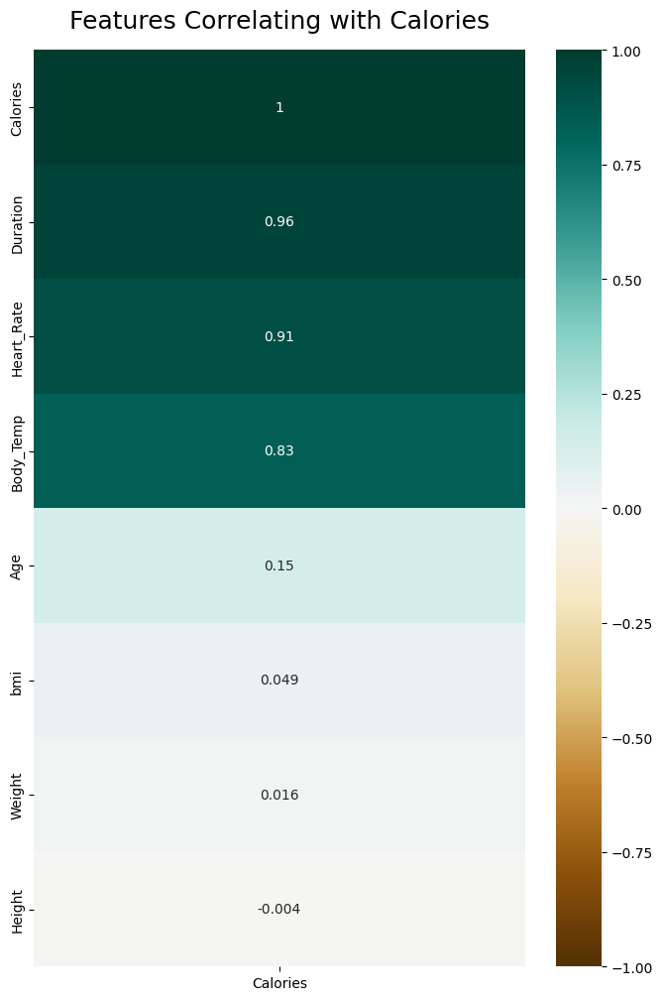

In [20]:
dataframe=train_ds.select(pl.col(num_features + [target] )).to_pandas()
target_col = "Calories"

plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(dataframe.corr()[[target_col]].sort_values(by=target_col, ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title(f"Features Correlating with {target_col}", fontdict={'fontsize':18}, pad=16)

,mean,median,min,max,std
Sex,,,,,
female,87.534761,80.0,1.0,300.0,57.905734
male,89.033683,73.0,1.0,314.0,66.590171


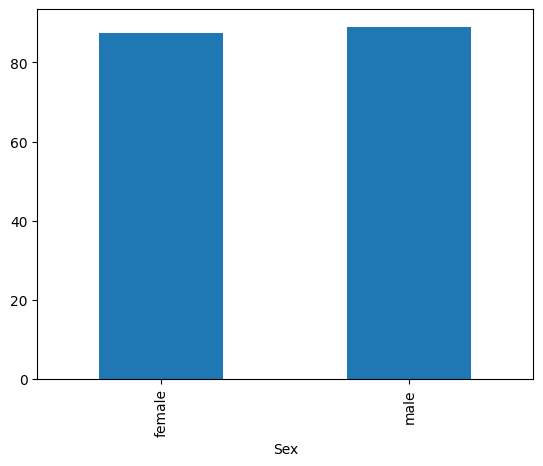

In [35]:
target_col = "Calories"
dataframe=train_ds.select(pl.col(cat_features + [target_col]) ).to_pandas()

for feature in cat_features:
    display(dataframe.groupby(feature)[target_col].agg(["mean", "median", "min", "max", "std"]))
    dataframe.groupby(feature)[target_col].mean().plot(kind="bar")
    

# Single-Factor Analysis

In [19]:

f = OrdinalEncoder().fit_transform(train_ds.select("Sex")).squeeze()
train_ds.with_columns(pl.Series(name="Sex", values=f))

id,Sex,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
i64,f64,i64,f64,f64,f64,f64,f64,f64
0,1.0,36,189.0,82.0,26.0,101.0,41.0,150.0
1,0.0,64,163.0,60.0,8.0,85.0,39.7,34.0
2,0.0,51,161.0,64.0,7.0,84.0,39.8,29.0
3,1.0,20,192.0,90.0,25.0,105.0,40.7,140.0
4,0.0,38,166.0,61.0,25.0,102.0,40.6,146.0
…,…,…,…,…,…,…,…,…
749995,1.0,28,193.0,97.0,30.0,114.0,40.9,230.0
749996,0.0,64,165.0,63.0,18.0,92.0,40.5,96.0
749997,1.0,60,162.0,67.0,29.0,113.0,40.9,221.0


In [20]:
for feat in num_features + cat_features:
    if feat == target:
        continue
    print(f"\nFIT FOR FEATURE {feat}\n")
    train = train_ds.select(pl.col([feat, target])).drop_nans()
    if feat in cat_features:
        f = OrdinalEncoder().fit_transform(train.select(feat)).squeeze()
        train = train.with_columns(pl.Series(name=feat, values=f))
    
    X = train.select(pl.col(feat)).to_numpy()
    y = train.select(pl.col(target)).to_numpy()
    results = sm.OLS(y, X).fit()
    print(results.summary())


FIT FOR FEATURE Age

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.633
Model:                            OLS   Adj. R-squared (uncentered):              0.633
Method:                 Least Squares   F-statistic:                          1.294e+06
Date:                Thu, 15 May 2025   Prob (F-statistic):                        0.00
Time:                        21:03:01   Log-Likelihood:                     -4.2005e+06
No. Observations:              750000   AIC:                                  8.401e+06
Df Residuals:                  749999   BIC:                                  8.401e+06
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------

# Feature Importances

In [ ]:

train, val = train_test_split(train_ds, train_size=0.8, random_state=24)


Sex_female,Sex_male,id,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
f64,f64,i64,i64,f64,f64,f64,f64,f64,f64
0.0,1.0,223930,69,179.0,86.0,7.0,89.0,39.5,38.0
1.0,0.0,561783,70,176.0,75.0,18.0,96.0,40.7,103.0
0.0,1.0,654126,22,185.0,86.0,6.0,86.0,39.0,18.0
0.0,1.0,52627,62,182.0,85.0,27.0,108.0,40.9,215.0
0.0,1.0,384611,48,194.0,92.0,3.0,86.0,38.8,12.0
…,…,…,…,…,…,…,…,…,…
0.0,1.0,478609,48,170.0,77.0,22.0,96.0,40.6,121.0
0.0,1.0,516439,69,187.0,95.0,5.0,87.0,39.5,26.0
0.0,1.0,211136,52,178.0,87.0,8.0,87.0,39.8,35.0


In [38]:



train, val = train_test_split(train_ds, train_size=0.8, random_state=24)
ct = ColumnTransformer(
    [("cat", OneHotEncoder(sparse_output=False), cat_features)]
    , remainder='passthrough'
    , verbose_feature_names_out=False
    )
ct.set_output(transform="polars")
train_prep: pl.dataframe = ct.fit_transform(train)
val_prep: pl.dataframe = ct.fit_transform(val)

X_train = train_prep.select(pl.all().exclude(misc_columns + [target]))
y_train = train_prep.select(target).to_series()


X_val = val_prep.select(pl.all().exclude(misc_columns + [target]))
y_val = val_prep.select(target).to_series()


seeds = list(range(10))

# for seed in seeds:
seed = 24 
rf = RandomForestRegressor().fit(X_train, y_train)
imps = permutation_importance(rf, X_val, y_val, n_repeats=5, n_jobs=-1, random_state=seed)
imps


c:\Users\Marc\OneDrive\projects\Kaggle\playground_series_0505\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


{'importances_mean': array([3.03039264e-03, 2.92991774e-03, 4.88851778e-02, 4.74124793e-04,
        2.62234005e-03, 8.28072004e-01, 3.37035725e-01, 4.13527823e-04]),
 'importances_std': array([4.19396895e-05, 4.02636214e-05, 2.95592466e-04, 6.25029830e-06,
        6.42353363e-06, 1.71749867e-03, 1.08755251e-03, 2.19012932e-05]),
 'importances': array([[3.08352297e-03, 3.00529611e-03, 3.02057498e-03, 2.97088754e-03,
         3.07168159e-03],
        [2.97710194e-03, 2.90699112e-03, 2.91116015e-03, 2.87723356e-03,
         2.97710192e-03],
        [4.88941878e-02, 4.83699439e-02, 4.91181071e-02, 4.88221674e-02,
         4.92214827e-02],
        [4.64570967e-04, 4.81480936e-04, 4.73944931e-04, 4.80165576e-04,
         4.70461556e-04],
        [2.62006129e-03, 2.62868937e-03, 2.61097438e-03, 2.62440412e-03,
         2.62757107e-03],
        [8.28546710e-01, 8.29047383e-01, 8.30504443e-01, 8.25887280e-01,
         8.26374205e-01],
        [3.38099042e-01, 3.35593481e-01, 3.38488081e-01, 3.3

<Axes: xlabel='importances', ylabel='features'>

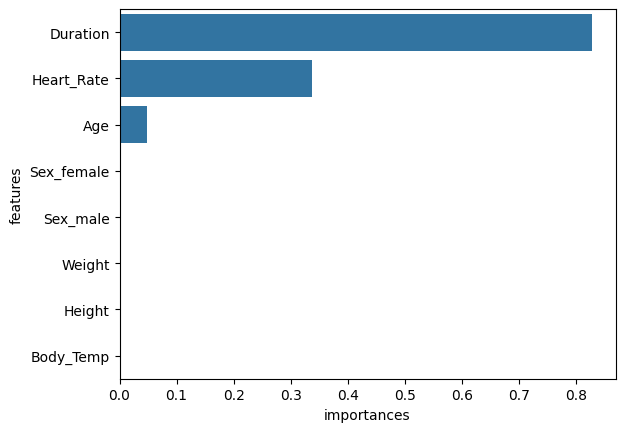

In [ ]:
imp_df = (pd.DataFrame()
            .assign(
                    features=X_train.columns,
                    importances=imps["importances_mean"]
                )
            .sort_values(by="importances", ascending=False)
            
            )

sns.barplot(imp_df, y="features", x="importances")



# Histogramme

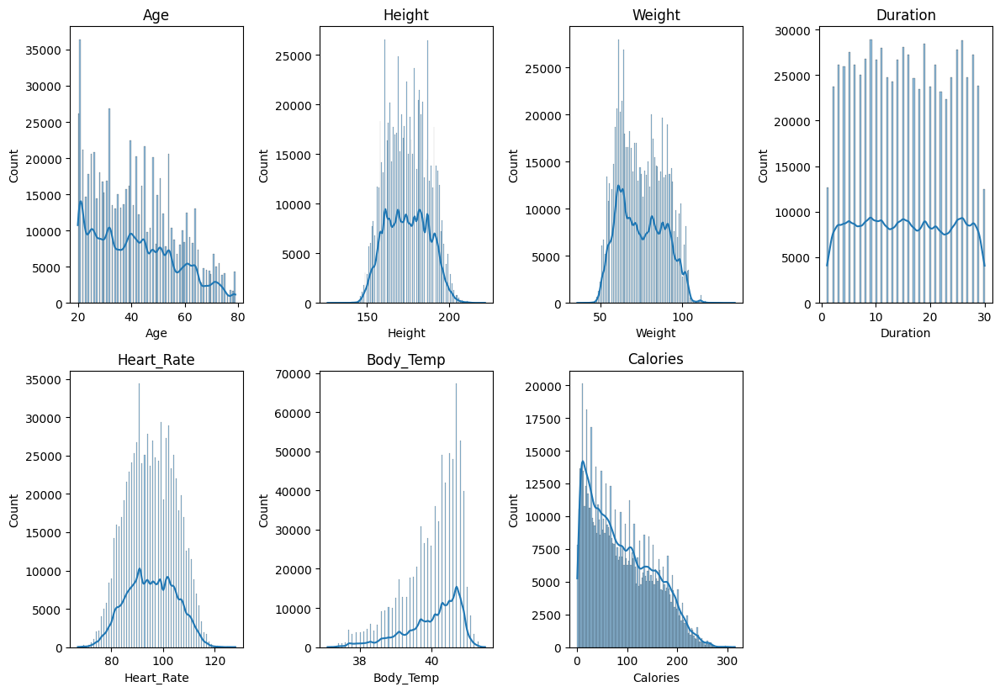

In [6]:
df = train_ds.to_pandas()

cols = 4
rows = math.ceil(len(features) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))

for i, feature in enumerate(num_features + [target]):
    ax = axes[i // cols, i % cols]
    sns.histplot(data=df, x=feature, kde=True, ax=ax)
    ax.set_title(f'{feature}')

# Falls es leere Subplots gibt
for j in range(i + 1, rows * cols):
    fig.delaxes(axes[j // cols, j % cols])

plt.tight_layout()
plt.show()

# Outlier Detection Isolation Forest

In [44]:
ct = ColumnTransformer(
    [("cat", OneHotEncoder(sparse_output=False), cat_features)]
    , remainder='passthrough'
    , verbose_feature_names_out=False
    )
ct.set_output(transform="polars")
train_prep: pl.dataframe = ct.fit_transform(train_ds.drop(misc_columns))

clf = IsolationForest(max_samples=1000, random_state=0)
clf.fit(train_prep)

IsolationForest(max_samples=1000, random_state=0)

In [47]:
# The lower, the more abnormal. Negative scores represent outliers, positive scores represent inliers.
outlier_score = clf.decision_function(train_prep)
train_ds_ol = train_ds.with_columns(pl.Series(name='Outlier_score',values=outlier_score))

In [64]:
n_samples = train_ds_ol.shape[0]
threshold = 0.005 # Remove 0.5% outliers
remove_idx = round(n_samples * 0.005)
inlier_ids = train_ds_ol.select(["id", "Outlier_score"]).sort(by="Outlier_score")[remove_idx:]
inlier_ids.write_csv(os.path.join(PREP_DATA_BASE, "inlier_ids.csv"))

3750